***Рынок заведений общественного питания Москвы***

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены

**Цель**: исследовать рынок заведений общественного питания Москвы, найти особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места

Задачи:

1. Изучить сткрутуру данных
2. Изучить наличие пропусков, дублиатов
3. Провести анализ общих данных, выявить закономерности
4. Изучить данные о кофейнях, выявить лучшие параметры для её открытия
5. Сделать отчёт в виде презентации

1. [Шаг 1. Загрузите данные и изучите общую информацию](#start)
2. [Шаг 2. Выполните предобработку данных](#some_id)
3. [Шаг 3. Анализ данных](#analys)
4. [Шаг 4. Детализируем исследование: открытие кофейни](#detail)
5. [Шаг 5. Подготовка презентации](#present)

***Шаг 1. Загрузите данные и изучите общую информацию***<a id="start"></a>

In [1]:
#загрузка библиотек
import numpy as np
import pandas as pd
import seaborn as sns

import seaborn as sns
from matplotlib import pyplot as plt

import plotly.express as px
from plotly import graph_objects as go

import folium
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем карту и хороплет
from folium import Map, Choropleth

In [2]:
#загрузим датасет
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.duplicated().sum()

0

Проведем очистку от неявных дубликатов

In [5]:
#проверка на неявные дубликаты в названиях
def name_good(text):
    text = text.replace('ё', 'е')
    text = text.replace('«', '')
    text = text.replace('»', '')
    text = text.lower()
    return text   
# создадим столбец с укороченными названиями
df['name'] = df['name'].apply(name_good)
df.name.sample(10)

1933                   персоны
513                 долина № 1
6971                 сити лайф
3908             nicepricecafe
7259               пицца паоло
4626                     j'pan
4851          кафе lights cafe
6273                  шава № 1
6621                fresh cafe
3657    sultan pizza & burgers
Name: name, dtype: object

***Шаг 2. Выполните предобработку данных***<a id="some_id"></a>

В датасете представлено 8406 заведений. Нет пропусков, значения полные

In [6]:
#создадим столбец с названием улицы
df['street'] = df['address'].str.split(', ').str[1]

In [7]:
#cоздадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [8]:
df.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,mr. уголек,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


***Шаг 3. Анализ данных***<a id="analys"></a>

***Функции для постороения графиков***

In [9]:
def bar(data, index, values, aggfunc, title):
    fig = px.bar(data.pivot_table(index=index, values=values, aggfunc=aggfunc), title=title)
    fig.show()

In [10]:
def map(data, group, column, agg, title):
    rating_df = data.groupby(group, as_index=False)[column].agg(agg)
    
    # загружаем JSON-файл с границами округов Москвы
    state_geo = '/datasets/admin_level_geomap.geojson'
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423
    
    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    
    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=rating_df,
        columns=[group, column],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)
    
    # выводим карту
    return m

**Какие категории заведений представлены в данных?**

In [11]:
category = df['category'].unique()
category

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [12]:
count_category = df.pivot_table(index=['category'], values='address', aggfunc='count').sort_values(by = 'category', ascending=False)
count_category.columns= ['values']

name_cat = count_category.index
values = count_category['values']

fig = go.Figure(data=[go.Pie(labels=name_cat, values=values, pull=[0.2, 0.1, 0.05])])
fig.update_layout(title='Распределение количества заведений по категориям')          
fig.show() 


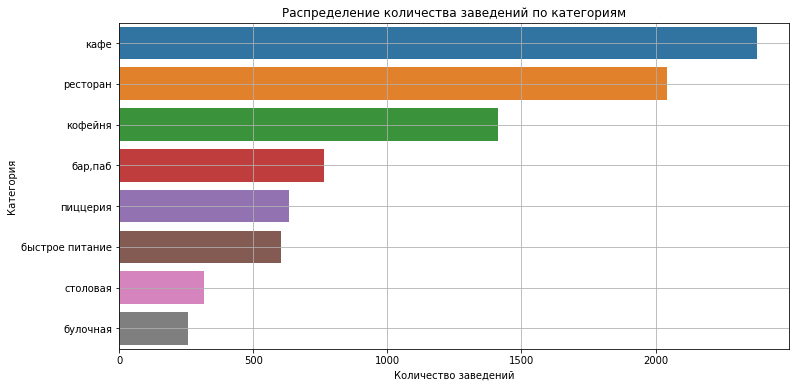

In [13]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='values', y='category', data=count_category.reset_index().sort_values(by='values', ascending=False))
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Категория')
ax.set_title('Распределение количества заведений по категориям')

plt.grid()
plt.show()

Больше всего в Москве кафе, ресторанов и кофеен

**Исследуйте количество посадочных мест в местах по категориям**

In [14]:
df_seat = df.pivot_table(index='category', values='seats', aggfunc='median').sort_values(by='seats', ascending=False)
df_seat.columns= ['seats']

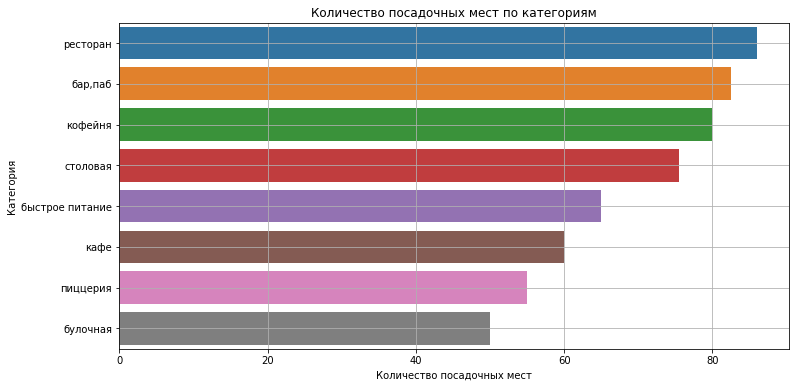

In [15]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='seats', y='category', data=df_seat.reset_index().sort_values(by='seats', ascending=False))
ax.set_xlabel('Количество посадочных мест')
ax.set_ylabel('Категория')
ax.set_title('Количество посадочных мест по категориям')

plt.grid()
plt.show()

Больше всего посадочных мест в барах, ресторанах, меньше - в булочных

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете**

In [16]:
count_chain = df.pivot_table(index=['chain'], values='address', aggfunc='count').sort_values(by = 'address', ascending=False)
count_chain.columns= ['values']

name_chain = count_chain.index
values = count_chain['values']

fig = go.Figure(data=[go.Pie(labels=name_chain, values=values)])
fig.update_layout(title='Распределение количества сетевых и несетевых заведений')          
fig.show() 

Несетевые - 61,9%, сетевые - 38,1%

**Какие категории заведений чаще являются сетевыми?**

In [17]:
chain_places = df[df['chain'] == 1].reset_index().sort_values(by='chain', ascending=False)

In [18]:
chain = ['в сетевых заведениях', 'в несетевых заведениях']
titles = ['Количесво заведений по категориям ', 'Количество заведений по районам ', 'Количество заведений по круглосуточности ']
index = ['category', 'district', 'is_24/7']
for i in range(len(index)):
    bar(chain_places, index[i], 'name', 'count', (str(titles[i]) + str(chain[0])))

Чаще всего сетевые заведения это - кафе, кофейни, рестораны

In [19]:
#Код ревьюера
df_chain_share = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
df_chain_share.columns = ['not_chain', 'chain']
df_chain_share['total'] = df_chain_share['not_chain'] + df_chain_share['chain']
df_chain_share['share'] = (df_chain_share['chain']/df_chain_share['total']*100).round().astype('int')
df_chain_share.sort_values(by='share', ascending=False)

,not_chain,chain,total,share
category,,,,
булочная,99,157,256,61
пиццерия,303,330,633,52
кофейня,693,720,1413,51
быстрое питание,371,232,603,38
ресторан,1313,730,2043,36
кафе,1599,779,2378,33
столовая,227,88,315,28
"бар,паб",596,169,765,22


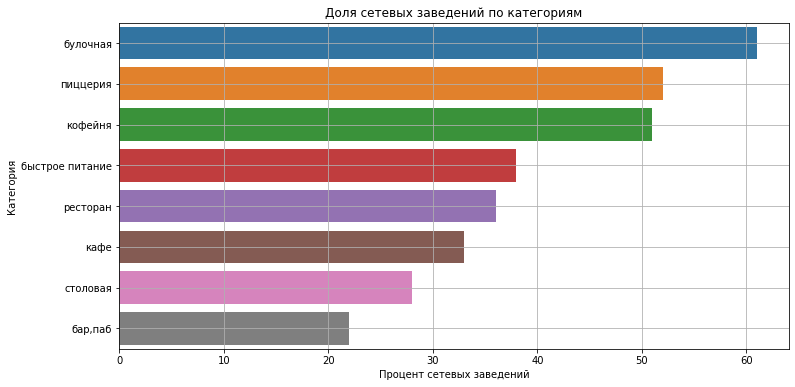

In [20]:
#Код ревьюера
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='share', y='category', data=df_chain_share.reset_index().sort_values(by='share', ascending=False))
ax.set_xlabel('Процент сетевых заведений')
ax.set_ylabel('Категория')
ax.set_title('Доля сетевых заведений по категориям')

plt.grid()
plt.show()

Чаще всего сетевые заведения это - булочные, пиццерии и кофейни 

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве**

In [21]:
count_category = pd.DataFrame(chain_places.groupby('name').count().sort_values(by='category', ascending=False).head(15)['category'])
count_category.columns= ['values']

name_cat = count_category.index
values = count_category['values']

fig = go.Figure(data=[go.Pie(labels=name_cat, values=values, pull=[0.2, 0.1, 0.05])])
fig.update_layout(title='топ-15 популярных сетей в Москве')          
fig.show() 

In [22]:
df_top_15 = df.groupby('name')[['name']].count()
df_top_15.columns = ['count_names']
df_top_15 = df_top_15.reset_index().sort_values(by= 'count_names', ascending = False).head(15)
df_top_15

,name,count_names
2824,кафе,189
5412,шоколадница,120
2531,домино'с пицца,77
2499,додо пицца,74
1137,one price coffee,72
5485,яндекс лавка,69
413,cofix,65
1263,prime,50
4988,хинкальная,44
5313,шаурма,43


<AxesSubplot:xlabel='category'>

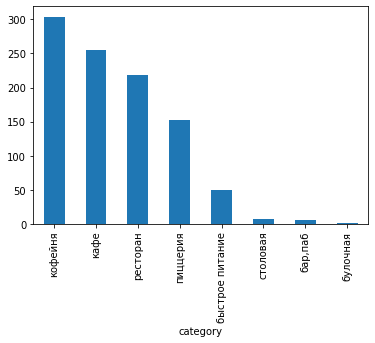

In [23]:
list_of_top = df_top_15['name']
df_top_all = df.loc[df['name'].isin(list_of_top)]
df_top_all.groupby('category')['category'].count().sort_values(ascending = False).plot(kind = 'bar')

топ-15 популярных сетей в Москве являются в основном кафе и кофейнями

**Какие административные районы Москвы присутствуют в датасете?**

In [24]:
district = df['district'].unique()
district

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

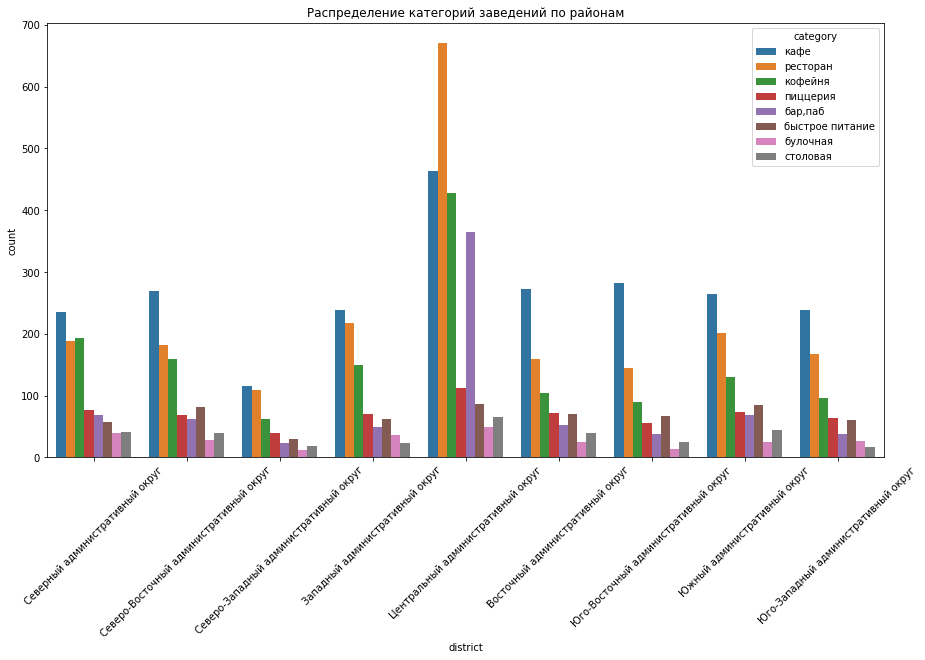

In [25]:
plt.figure(figsize=(15, 8))
sns.countplot(x='district', hue='category', data=df)
plt.xticks(rotation=45)
plt.title('Распределение категорий заведений по районам')
plt.show()

Больше всего заведений в центре, соотношение по категориям примерно одинаковое для всех районов кроме центра, там наибольшая доля у ресторанов

**Визуализируйте распределение средних рейтингов по категориям заведений**

In [26]:
rating_category = pd.DataFrame(df.groupby('category')['rating'].mean()).sort_values(by='rating', ascending = False)
rating_category.columns = ['rating']

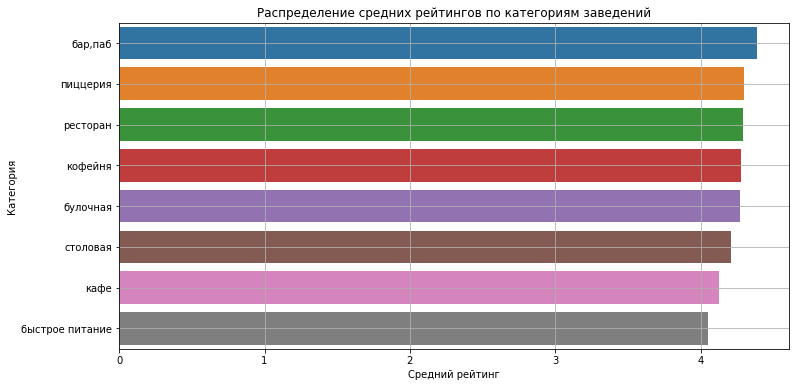

In [27]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='rating', y='category', data=rating_category.reset_index().sort_values(by='rating', ascending=False))
ax.set_xlabel('Средний рейтинг')
ax.set_ylabel('Категория')
ax.set_title('Распределение средних рейтингов по категориям заведений')

plt.grid()
plt.show()

Наивысший рейтинг у баров и пабов, худший - у заведений быстрого питания

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района**

In [28]:
map(df, 'district', 'rating', 'median', 'Средний рейтинг заведений по районам')

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium**

In [29]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

**Найдите топ-15 улиц по количеству заведений**

In [30]:
top_15_data = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)
top_list = top_15_data.index
top_15_data

,name
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


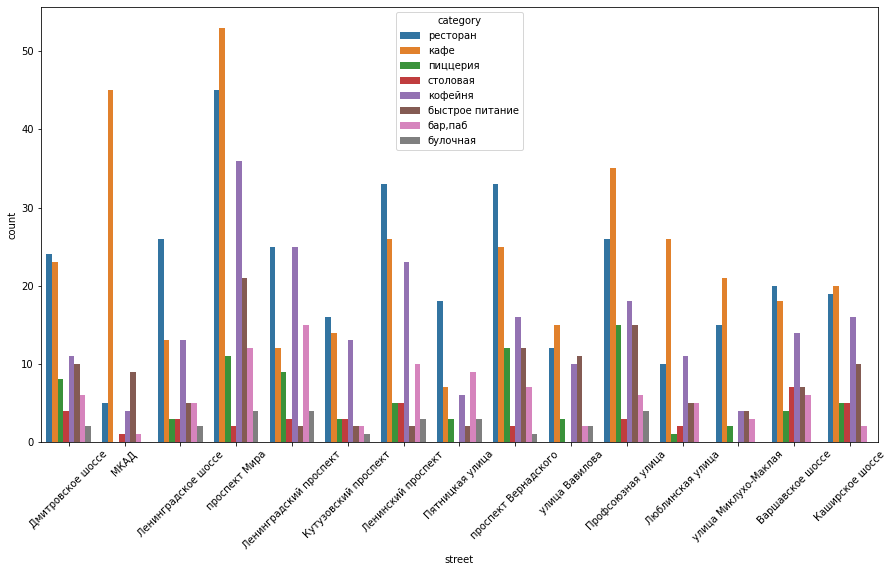

In [31]:
top_15_data = df.query('street in @top_list')
plt.figure(figsize=(15, 8))
sns.countplot(x='street', hue='category', data=top_15_data)
plt.xticks(rotation=45)
plt.show()

Больше всего заведений находится на проспекте Мира

**Найдите улицы, на которых находится только один объект общепита**

In [32]:
one_count = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
one_count.columns = ['count']
one_count = one_count[one_count['count'] == 1]
one_count

,count
street,
1-й Автозаводский проезд,1
Одинцовская улица,1
Октябрьский переулок,1
Ордынский тупик,1
Оренбургская улица,1
...,...
3-й Хорошёвский проезд,1
Бобров переулок,1
Богословский переулок,1


В основном улицы с одним заведением это тупики, переулки или проезды

**Постройте фоновую картограмму (хороплет) со значениями медианной стоимости заказа для каждого района**

In [33]:
map(df, 'district', 'middle_avg_bill', 'median', 'Медианная стоимость заказа для каждого района')

На западе и в центре Москвы медианная стоимость заказа наивысшая. Чем дальше от центра, тем ниже стоимость заказа, кроме запада Москвы

***Выводы:***

1. Больше всего в Москве кафе, ресторанов и кофеен    
2. Больше всего посадочных мест в барах, ресторанах, меньше - в булочных    
3. Несетевые - 61,9%, сетевые - 38,1%    
4. Чаще всего сетевые заведения это - булочные, пиццерии и кофейни
5. Топ-15 популярных сетей в Москве являются в основном кафе и кофейнями
6. Больше всего заведений в центре, соотношение по категориям примерно одинаковое для всех районов кроме центра, там наибольшая доля у ресторанов
7. Наивысший рейтинг у баров и пабов, худший - у заведений быстрого питания
8. Больше всего заведений находится на проспекте Мира
9. В основном улицы с одним заведением это тупики, переулки или проезды
10. На западе и в центре Москвы медианная стоимость заказа наивысшая. Чем дальше от центра, тем ниже стоимость заказа, кроме запада Москвы

***Шаг 4. Детализируем исследование: открытие кофейни***<a id="detail"></a>

**Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

In [34]:
coffee = df[df['category'] == 'кофейня'].sort_values(by='district', ascending=False)
coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
7098,coffee13,кофейня,"Москва, Каширское шоссе, 25Б, стр. 7",Южный административный округ,"ежедневно, 07:00–21:00",55.655881,37.648894,4.8,NaN,NaN,NaN,NaN,0,200.0,Каширское шоссе,False
6969,cofix,кофейня,"Москва, Балаклавский проспект, 5А, стр. 10",Южный административный округ,"пн-пт 07:00–22:00; сб,вс 08:00–22:00",55.640252,37.608196,4.3,NaN,Цена чашки капучино:от 60 ₽,NaN,60.0,1,NaN,Балаклавский проспект,False
7896,coffee way,кофейня,"Москва, Кустанайская улица, 6",Южный административный округ,"пн-пт 08:00–23:00; сб,вс 09:00–23:00",55.619629,37.752522,4.3,низкие,NaN,NaN,NaN,1,80.0,Кустанайская улица,False
7893,просто кофе,кофейня,"Москва, Ясеневая улица, 12, корп. 1",Южный административный округ,"пн-пт 08:00–21:30; сб,вс 09:00–21:30",55.601711,37.728736,4.7,NaN,Цена чашки капучино:от 100 ₽,NaN,100.0,0,90.0,Ясеневая улица,False
7882,udcкафе,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 10:00–22:00",55.621780,37.713177,4.4,средние,Средний счёт:800–1000 ₽,900.0,NaN,1,NaN,Каширское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2735,кофетут,кофейня,"Москва, Уральская улица, 25",Восточный административный округ,"ежедневно, 08:00–22:00",55.823536,37.808019,4.5,NaN,Цена чашки капучино:60–300 ₽,NaN,180.0,0,NaN,Уральская улица,False
2743,ozzy,кофейня,"Москва, Краснобогатырская улица, 90, стр. 2",Восточный административный округ,"пн-пт 08:30–20:30; сб,вс 10:00–21:00",55.800373,37.709843,4.6,средние,Цена чашки капучино:150–210 ₽,NaN,180.0,0,52.0,Краснобогатырская улица,False
2749,dormouse,кофейня,"Москва, Хабаровская улица, 15",Восточный административный округ,"ежедневно, 08:00–22:00",55.822613,37.823831,4.4,NaN,NaN,NaN,NaN,0,75.0,Хабаровская улица,False
2755,one price coffee,кофейня,"Москва, Измайловское шоссе, 69Д",Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 08:00–22:00",55.788299,37.747706,4.8,NaN,NaN,NaN,NaN,1,55.0,Измайловское шоссе,False


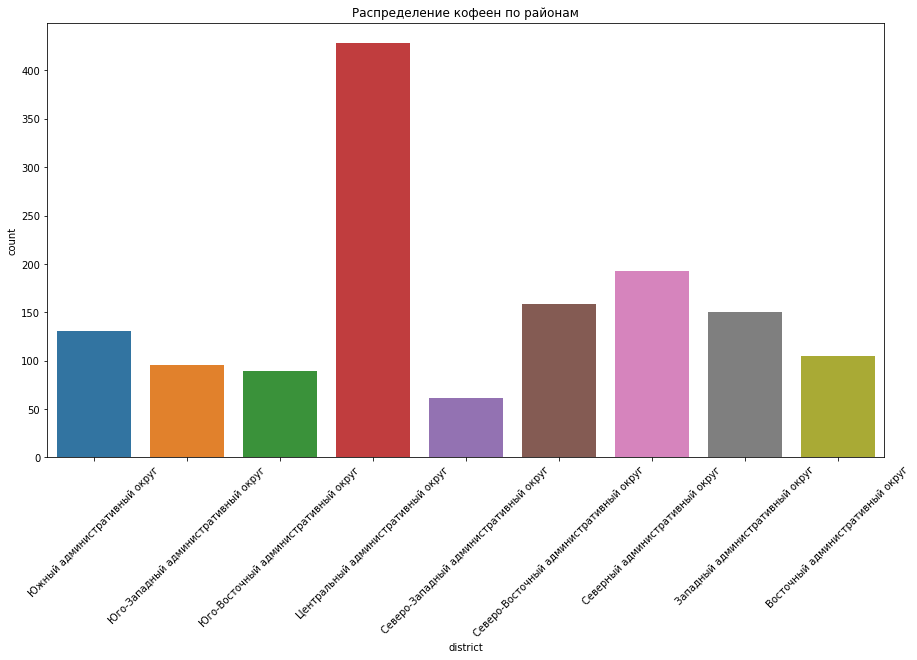

In [35]:
plt.figure(figsize=(15, 8))
sns.countplot(x='district', data=coffee.reset_index().sort_values(by='district', ascending=False))
plt.xticks(rotation=45)
plt.title('Распределение кофеен по районам')
plt.show()

Наибольше количество кофеен располагается в центре

In [36]:
map(coffee, 'district', 'name', 'count', 'Распределение кофеен по районам')

Наибольшее количество кофеен в центре

**Есть ли круглосуточные кофейни?**

In [37]:
coffee['is_24/7'].sum()

59

Да, и их 59 штук

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [38]:
coffee['rating'].median()

4.3

In [39]:
map(coffee, 'district', 'rating', 'median', 'Медианный рейтинг кофеен по районам')

**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [40]:
coffee['middle_coffee_cup'].median()

170.0

Оринтироваться стоит на цену в 170 рублей, хотя цену стоит выбирать в зависимости от района, где собираемся открывать кофейню

Распределение цены чашки кофе по районам

In [41]:
map(coffee, 'district', 'middle_coffee_cup', 'median', 'Медианная цена чашки капучино')

Для максимизации прибыли следует учитывать, чтоможно ориентироваться на цену в центре и на западе в пределах 188-198 руб, тогда как на востоке на 135 руб

**Рекомендация:**

1) открывать кофейню не в центре, т.к. рынок кофеен перенасыщен в данном районе

2) если рассматривать вариант круглосуточной кофейни, то её также следует открывать не в центре, однако место следует выбирать с большой проходимостью в том числе и в ночные часы и это тема для отдельного исследования

3) рассмотреть как наиболее подходящий район для открытия кофейни - юго-восток, т.к. кофеен там достаточно мало, конкуренция меньше, при этом стоимость чашки капучино не самая минимальная и рейтинг в целом соответсвует среднему по городу